# CMS ex situ waxs 2023C2

# CMS GIWAXS raw data processing & exporting notebook
In this notebook you output xr.DataSets stored as .zarr stores containing all your raw,
remeshed (reciprocal space), and caked CMS GIWAXS data. Saving as a zarr automatically converts the array to a dask array!

In [ ]:
### Kernel updates if needed, remember to restart kernel after running this cell!:
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory

## Imports

In [2]:
### Imports:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import xarray as xr
import PyHyperScattering as phs
import pygix
import gc
from tqdm.auto import tqdm  # progress bar loader!

print(f'Using PyHyperScattering Version: {phs.__version__}')

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


Using PyHyperScattering Version: 0+untagged.526.g13657de


## Defining some objects

### Define & check paths

In [3]:
# I like pathlib for its readability & checkability, it's also necessary for the loadSeries function later on
# Replace the paths with the ones relevant to your data, you can use the ".exists()" method to make sure you defined a path correctly
userPath = pathlib.Path('/nsls2/users/alevin')
propPath = pathlib.Path('/nsls2/data/cms/proposals/2023-2/pass-311415')
dataPath = propPath.joinpath('KWhite4/waxs')
samplesPath = dataPath.joinpath('stitched')
maskponiPath = userPath.joinpath('giwaxs_suite/beamline_data/maskponi')  # place for pyhyper-drawn masks and poni files
outPath = propPath.joinpath('AL_processed_data')

# Select poni & mask filepaths
poniFile = maskponiPath.joinpath('AgBH.poni')
maskFile = maskponiPath.joinpath('stitched_waxs.json')

# Creat pg Transform objects with the above information:
energy = 17
pg_transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, energy=energy)
# qpara_transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, inplane_config='q_para')
# qperp_transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, inplane_config='q_perp')

# Colormap
cmap = plt.cm.turbo
cmap.set_bad('black')

In [4]:
samplesPath

PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched')

In [5]:
sorted([f.name for f in samplesPath.glob("LK*_A*")])  # a simple way to list just the filenames and not the whole path

['LK_A10p1_pos1_x-0.000_th0.100_5.00s_1119305_waxs_stitched.tiff',
 'LK_A10p1_pos1_x-0.000_th0.110_5.00s_1119306_waxs_stitched.tiff',
 'LK_A10p1_pos1_x-0.000_th0.120_5.00s_1119310_waxs_stitched.tiff',
 'LK_A10p1_pos1_x-0.000_th0.140_5.00s_1119307_waxs_stitched.tiff',
 'LK_A10p1_pos1_x-0.000_th0.200_5.00s_1119308_waxs_stitched.tiff',
 'LK_A10p1_pos1_x-0.000_th0.500_5.00s_1119309_waxs_stitched.tiff',
 'LK_A10p2_pos1_x-0.000_th0.100_5.00s_1119317_waxs_stitched.tiff',
 'LK_A10p2_pos1_x-0.000_th0.120_5.00s_1119322_waxs_stitched.tiff',
 'LK_A10p2_pos1_x-0.000_th0.140_5.00s_1119319_waxs_stitched.tiff',
 'LK_A10p2_pos1_x-0.000_th0.200_5.00s_1119320_waxs_stitched.tiff',
 'LK_A10p2_pos1_x-0.000_th0.500_5.00s_1119321_waxs_stitched.tiff',
 'LK_A11p1_pos1_x-0.000_th0.100_5.00s_1119329_waxs_stitched.tiff',
 'LK_A11p1_pos1_x-0.000_th0.120_5.00s_1119334_waxs_stitched.tiff',
 'LK_A11p1_pos1_x-0.000_th0.140_5.00s_1119331_waxs_stitched.tiff',
 'LK_A11p1_pos1_x-0.000_th0.200_5.00s_1119332_waxs_stitched.ti

In [6]:
sorted([f.name for f in samplesPath.glob("ME*_A*")])  # a simple way to list just the filenames and not the whole path

['ME_A1_pos1_x-0.000_th0.100_5.00s_1118965_waxs_stitched.tiff',
 'ME_A1_pos1_x-0.000_th0.120_5.00s_1118970_waxs_stitched.tiff',
 'ME_A1_pos1_x-0.000_th0.140_5.00s_1118967_waxs_stitched.tiff',
 'ME_A1_pos1_x-0.000_th0.200_5.00s_1118968_waxs_stitched.tiff',
 'ME_A1_pos1_x-0.000_th0.500_5.00s_1118969_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.100_5.00s_1118977_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.110_5.00s_1118978_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.120_5.00s_1118982_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.140_5.00s_1118979_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.200_5.00s_1118980_waxs_stitched.tiff',
 'ME_A2_pos1_x-0.000_th0.500_5.00s_1118981_waxs_stitched.tiff',
 'ME_A3p1_pos1_x-0.000_th0.100_5.00s_1118989_waxs_stitched.tiff',
 'ME_A3p1_pos1_x-0.000_th0.110_5.00s_1118990_waxs_stitched.tiff',
 'ME_A3p1_pos1_x-0.000_th0.120_5.00s_1118994_waxs_stitched.tiff',
 'ME_A3p1_pos1_x-0.000_th0.140_5.00s_1118991_waxs_stitched.tiff',
 'ME_A3p1_pos1_x-0.000_th0.200_5

In [7]:
# Generate sets for samples if necessary to combine/separate different files

# Create separate sets per your data:
ME_set = set(samplesPath.glob("ME*_A*"))
LK_set = set(samplesPath.glob("LK*_A*"))
bc_set = ME_set.union(LK_set)

# Check content of sets
print('Blade coated ex situ sample set:')

# A very pythonic line to get the number to the right of the A and to the left of any 'p' if it exists
key = lambda x: int(''.join([i for i in x.name.split('A')[1].split('_')[0].split('p')[0] if i.isdigit()]))
bc_list = sorted(bc_set, key=key)
display(bc_list)

Blade coated ex situ sample set:


[PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.500_5.00s_1118969_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.200_5.00s_1118968_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.100_5.00s_1118965_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.140_5.00s_1118967_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.120_5.00s_1118970_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A2_pos1_x-0.000_th0.110_5.00s_1118978_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A2_pos1_x-0.000_th0.140_5.00s_1118979_waxs_stitched.tiff'),
 Posix

### Define metadata naming scheme & initialize loaders

In [8]:
# ex situ metadata filename naming schemes:
PM6_md_naming_scheme = ['project', 'polymer', 'weight_percent', 'detector_pos', 'sample_pos', 'incident_angle',
                        'exposure_time', 'scan_id', 'detector', 'stitched']

ASeries_md_naming_scheme = ['project', 'film', 'detector_pos', 'sample_pos', 'incident_angle', 'exposure_time',
                            'scan_id', 'detector', 'stitched']

bc_md_naming_scheme = ['project', 'sample_id', 'detector_pos', 'sample_pos', 'incident_angle', 'exposure_time',
                       'scan_id', 'detector', 'stitched']

# Initalize CMSGIWAXSLoader objects with the above naming schemes
PM6_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=PM6_md_naming_scheme)
ASeries_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=ASeries_md_naming_scheme)
bc_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=bc_md_naming_scheme)

## Data processing
Break this section up however makes sense for your data

### A1-3 acceptor series set

In [9]:
ASeries_set = set(samplesPath.glob("KW*_A*")).union(set(samplesPath.glob("KW*D18*")))

In [13]:
sorted([f.name for f in ASeries_set])

['KW_A1_pos1_x-0.000_th0.100_10.00s_1116604_waxs_stitched.tiff',
 'KW_A1_pos1_x-0.000_th0.120_10.00s_1116605_waxs_stitched.tiff',
 'KW_A1_pos1_x-0.000_th0.140_10.00s_1116606_waxs_stitched.tiff',
 'KW_A2_pos1_x-0.000_th0.100_10.00s_1116622_waxs_stitched.tiff',
 'KW_A2_pos1_x-0.000_th0.120_10.00s_1116623_waxs_stitched.tiff',
 'KW_A2_pos1_x-0.000_th0.140_10.00s_1116624_waxs_stitched.tiff',
 'KW_A3_pos1_x0.000_th0.100_10.00s_1116634_waxs_stitched.tiff',
 'KW_A3_pos1_x0.000_th0.120_10.00s_1116635_waxs_stitched.tiff',
 'KW_A3_pos1_x0.000_th0.140_10.00s_1116636_waxs_stitched.tiff',
 'KW_D18A1p1_pos1_x-0.000_th0.100_10.00s_1116592_waxs_stitched.tiff',
 'KW_D18A1p1_pos1_x-0.000_th0.120_10.00s_1116593_waxs_stitched.tiff',
 'KW_D18A1p1_pos1_x-0.000_th0.140_10.00s_1116594_waxs_stitched.tiff',
 'KW_D18A1p2_pos1_x-0.000_th0.100_10.00s_1116598_waxs_stitched.tiff',
 'KW_D18A1p2_pos1_x-0.000_th0.120_10.00s_1116599_waxs_stitched.tiff',
 'KW_D18A1p2_pos1_x-0.000_th0.140_10.00s_1116600_waxs_stitched.tiff'

In [ ]:
# for f in sorted(ASeries_set):
#     name = f.name
#     if len(name.split('_')) == 10:
#         print(name)
#         # newname = name[:-58] + name[-57:]
#         # print(newname)
#         # f.rename(samplesPath / newname)

In [45]:
sorted(ASeries_set)[0].stem

'KW_A1_pos1_x-0.000_th0.100_10.00s_1116604_waxs_stitched'

In [74]:
# Select the first element of the sorted set outside of the for loop to initialize the xr.DataSet
DA = ASeries_loader.loadSingleImage(sorted(ASeries_set)[0])
recip_DA, caked_DA = pg_transformer.pg_convert(DA)

recip_coords = recip_DA.coords
caked_coords = caked_DA.coords

# Create a DataSet, each DataArray will be named according to it's scan id
raw_DS = DA.to_dataset(name=DA.scan_id)
recip_DS = recip_DA.to_dataset(name=DA.scan_id)
caked_DS = caked_DA.to_dataset(name=DA.scan_id)

# Populate the Dataset with 
for filepath in tqdm(sorted(ASeries_set)[1:], desc=f'Transforming Raw Data'):
    DA = ASeries_loader.loadSingleImage(filepath)
    recip_DA, caked_DA = pg_transformer.pg_convert(DA)
    
    recip_DA = recip_DA.interp(recip_coords)
    caked_DA = caked_DA.interp(caked_coords)    
    
    raw_DS[f'{DA.scan_id}'] = DA
    recip_DS[f'{DA.scan_id}'] = recip_DA    
    caked_DS[f'{DA.scan_id}'] = caked_DA

Transforming Raw Data:   0%|          | 0/29 [00:00<?, ?it/s]

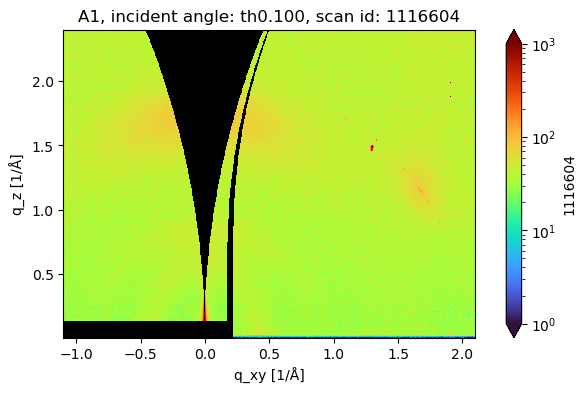

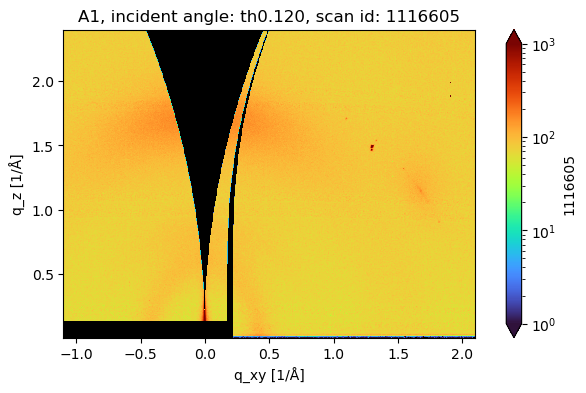

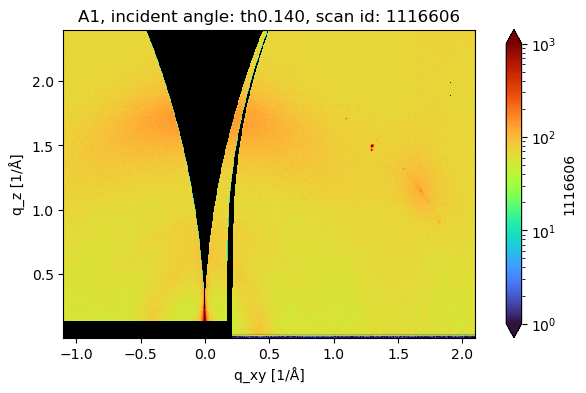

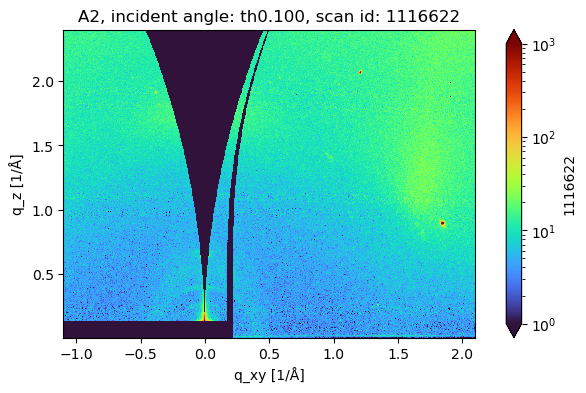

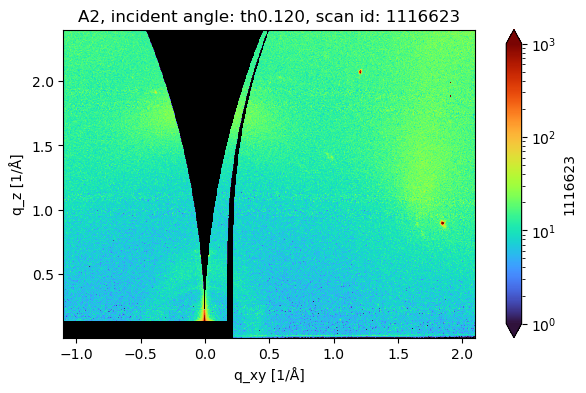

...

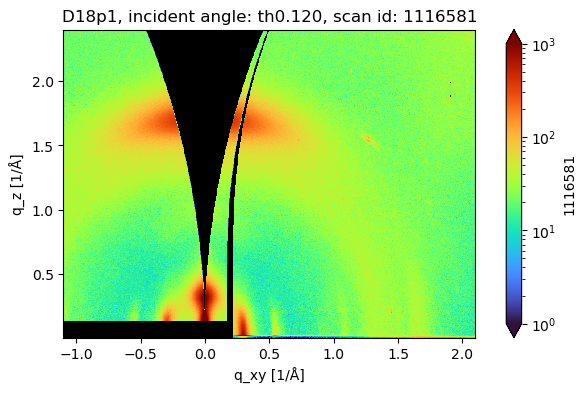

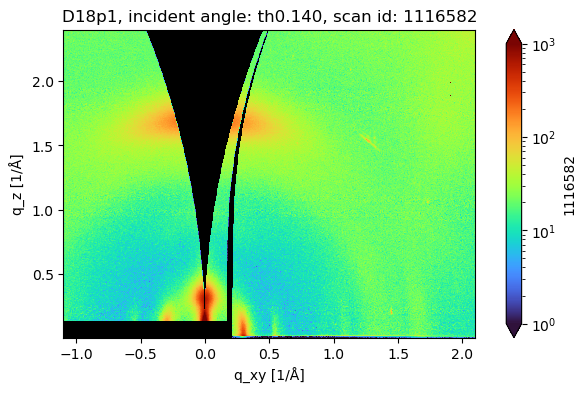

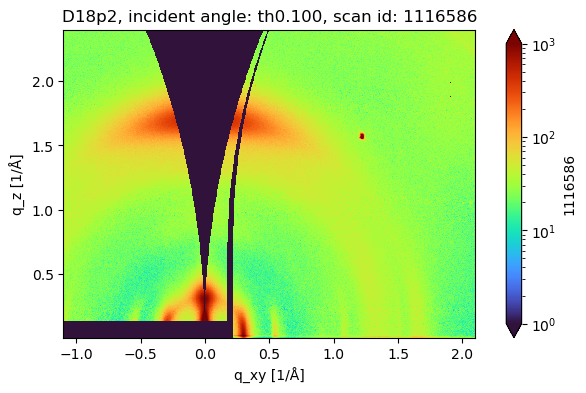

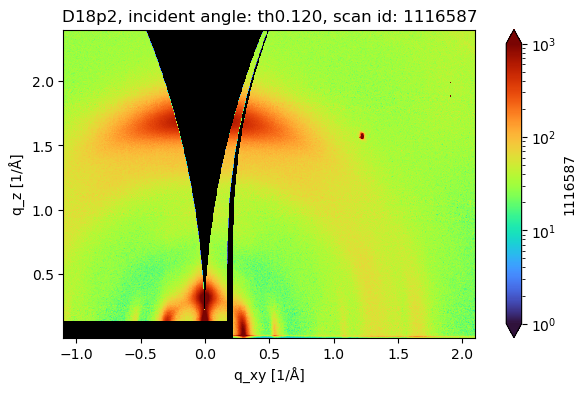

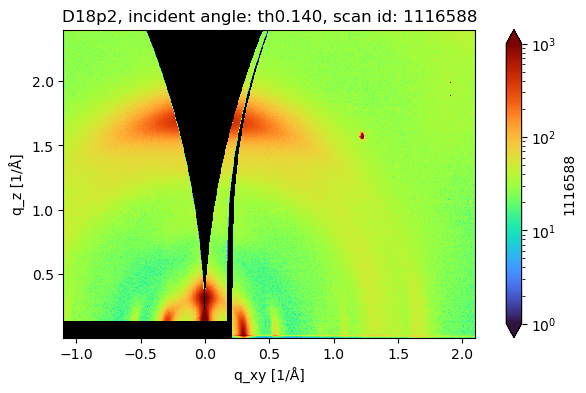

In [77]:
for DA in recip_DS.data_vars.values():   
    ax = DA.sel(q_xy=slice(-1.1, 2.1), q_z=slice(-0.05, 2.4)).plot.imshow(cmap=cmap, norm=LogNorm(1e0, 1e3), figsize=(8,4))
    ax.axes.set(aspect='equal', title=f'{DA.film}, incident angle: {DA.incident_angle}, scan id: {DA.scan_id}')
    plt.show()

#### save as zarr store

In [78]:
# Specify a suffix for saving the raw, recip, and caked DataSets. 
suffix=f'A1-3set_waxs_stitched'

raw_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'caked_{suffix}.zarr'), mode='w')

### PM6:Y6 set

#### Load the images into a single xr.DataSet:

In [50]:
PM6_list = sorted([f.name for f in samplesPath.glob("*PM6*")])
PM6_list

['KW_PM6_00_pos1_x-0.000_th0.100_10.00s_1116475_waxs_stitched.tiff',
 'KW_PM6_00_pos1_x-0.000_th0.120_10.00s_1116476_waxs_stitched.tiff',
 'KW_PM6_00_pos1_x-0.000_th0.140_10.00s_1116477_waxs_stitched.tiff',
 'KW_PM6_100_pos1_x-0.000_th0.100_10.00s_1116469_waxs_stitched.tiff',
 'KW_PM6_100_pos1_x-0.000_th0.120_10.00s_1116470_waxs_stitched.tiff',
 'KW_PM6_100_pos1_x-0.000_th0.140_10.00s_1116471_waxs_stitched.tiff',
 'KW_PM6_60_pos1_x0.000_th0.100_10.00s_1116499_waxs_stitched.tiff',
 'KW_PM6_60_pos1_x0.000_th0.120_10.00s_1116500_waxs_stitched.tiff',
 'KW_PM6_60_pos1_x0.000_th0.140_10.00s_1116501_waxs_stitched.tiff',
 'KW_PM6_70_pos1_x0.000_th0.100_10.00s_1116493_waxs_stitched.tiff',
 'KW_PM6_70_pos1_x0.000_th0.120_10.00s_1116494_waxs_stitched.tiff',
 'KW_PM6_70_pos1_x0.000_th0.140_10.00s_1116495_waxs_stitched.tiff',
 'KW_PM6_80_pos1_x-0.000_th0.140_10.00s_1116489_waxs_stitched.tiff',
 'KW_PM6_80_pos1_x0.000_th0.100_10.00s_1116487_waxs_stitched.tiff',
 'KW_PM6_80_pos1_x0.000_th0.120_10.00s

In [70]:
# Select the first element of the sorted set outside of the for loop to initialize the xr.DataSet
PM6_list = sorted(samplesPath.glob("*PM6*"))
DA = PM6_loader.loadSingleImage(PM6_list[0])
recip_DA, caked_DA = pg_transformer.pg_convert(DA)

recip_coords = recip_DA.coords
caked_coords = caked_DA.coords

# Create a DataSet, each DataArray will be named according to it's scan id
raw_DS = DA.to_dataset(name=DA.scan_id)
recip_DS = recip_DA.to_dataset(name=DA.scan_id)
caked_DS = caked_DA.to_dataset(name=DA.scan_id)

# Populate the DataSet with 
for filepath in tqdm(PM6_list[1:], desc=f'Transforming Raw Data'):
    DA = PM6_loader.loadSingleImage(filepath)
    recip_DA, caked_DA = pg_transformer.pg_convert(DA)
    
    recip_DA = recip_DA.interp(recip_coords)
    caked_DA = caked_DA.interp(caked_coords)
    
    raw_DS[f'{DA.scan_id}'] = DA
    recip_DS[f'{DA.scan_id}'] = recip_DA    
    caked_DS[f'{DA.scan_id}'] = caked_DA

Transforming Raw Data:   0%|          | 0/17 [00:00<?, ?it/s]

In [ ]:
selected_dataarrays_dict = {da.name: da for da in caked_DS.data_vars.values() if 
                            da.attrs['incident_angle'] == 'th0.120'}
ds = xr.Dataset(selected_dataarrays_dict)
ds

In [ ]:
caked_DS

In [ ]:
raw_DS['1116476'].plot.imshow(cmap=cmap, norm=LogNorm(1e1, 1e4), origin='upper')

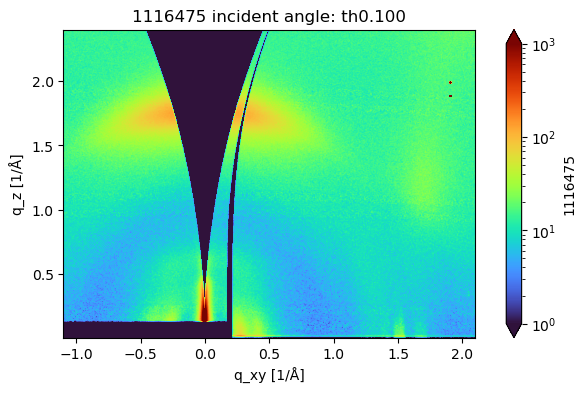

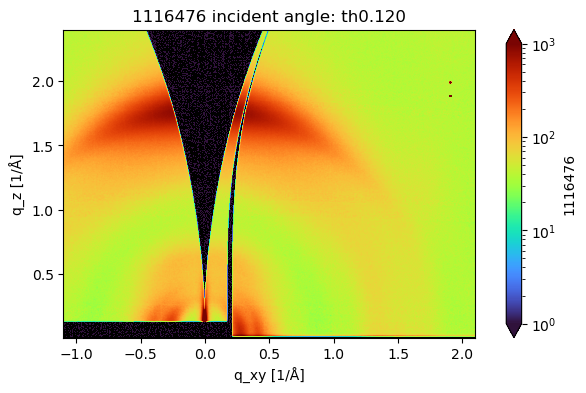

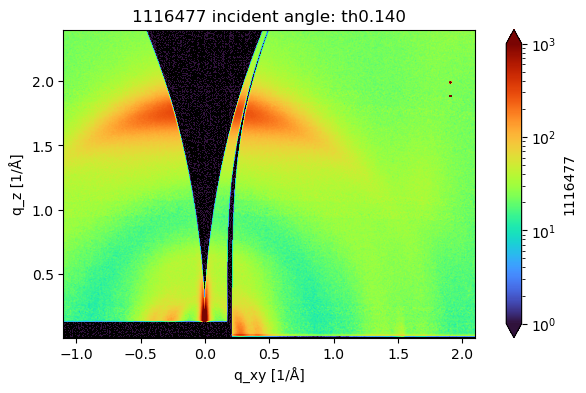

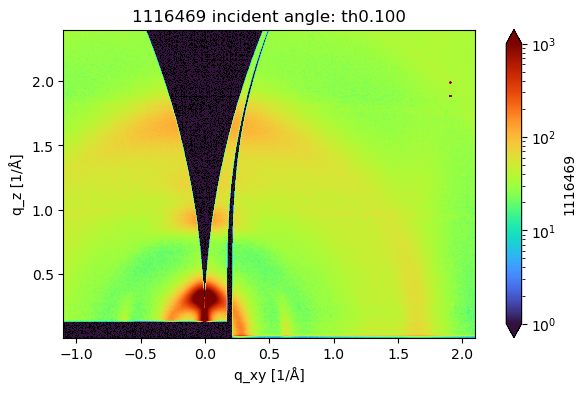

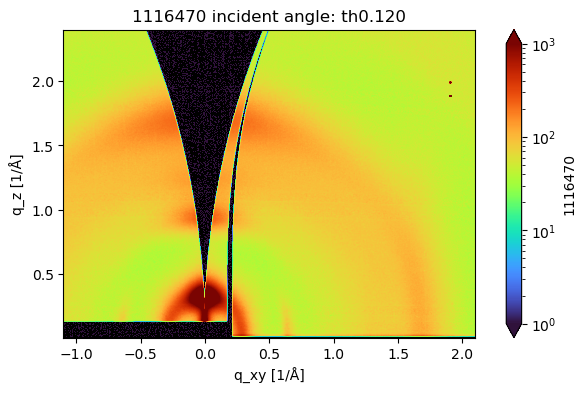

...

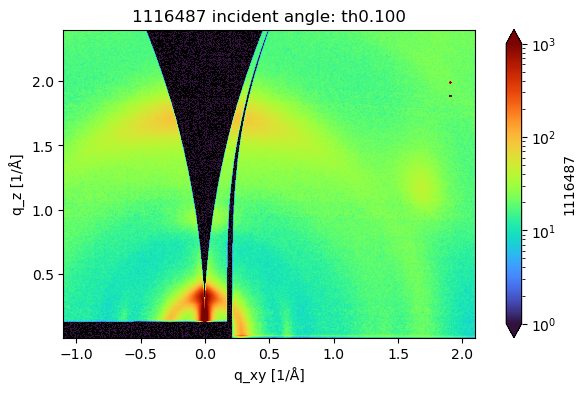

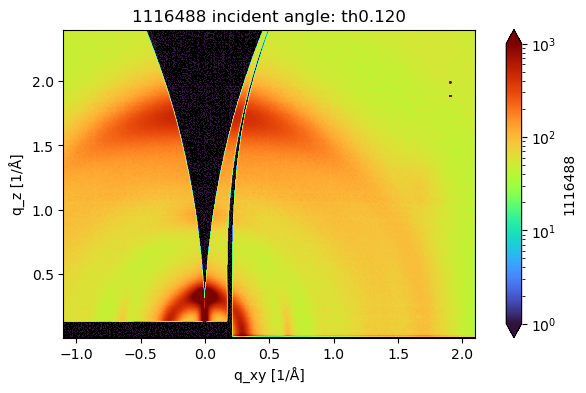

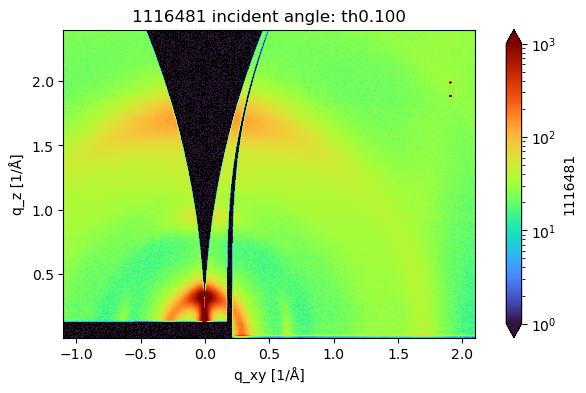

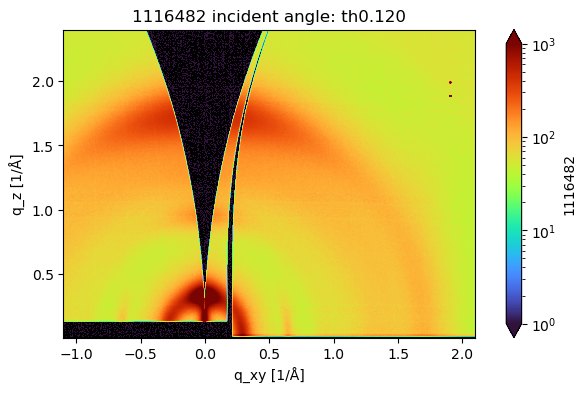

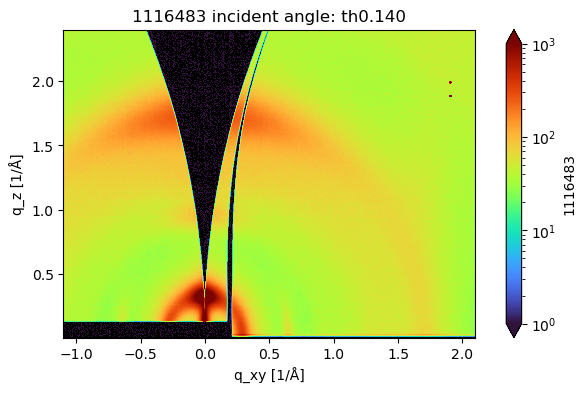

In [72]:
for DA in recip_DS.data_vars.values():   
    ax = DA.sel(q_xy=slice(-1.1, 2.1), q_z=slice(-0.05, 2.4)).plot.imshow(cmap=cmap, norm=LogNorm(1e0, 1e3), figsize=(8,4), interpolation='antialiased')
    ax.axes.set(aspect='equal', title=f'{DA.scan_id} incident angle: {DA.incident_angle}')
    plt.show()

In [ ]:
ax = caked_DA.sel().plot.imshow(cmap=cmap, norm=LogNorm(1e1, 1e4), figsize=(8,4))
# ax.axes.set(aspect='equal')

#### Save dataset as a .zarr store:

In [ ]:
caked_DS

In [73]:
# Specify a suffix for saving the raw, recip, and caked DataSets. 
suffix=f'PM6-Y6_waxs_stitched'

raw_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'caked_{suffix}.zarr'), mode='w')

### Blade coated set

#### Load the images into a single xr.DataSet:

In [9]:
# Select the first element of the sorted set outside of the for loop to initialize the xr.DataSet
DA = bc_loader.loadSingleImage(bc_list[0])
recip_DA, caked_DA = pg_transformer.pg_convert(DA)

recip_coords = recip_DA.coords
caked_coords = caked_DA.coords

# Create a DataSet, each DataArray will be named according to it's scan id
raw_DS = DA.to_dataset(name=DA.scan_id)
recip_DS = recip_DA.to_dataset(name=DA.scan_id)
caked_DS = caked_DA.to_dataset(name=DA.scan_id)

# Populate the DataSet with 
for filepath in tqdm(bc_list[1:], desc=f'Transforming Raw Data'):
    DA = bc_loader.loadSingleImage(filepath)
    recip_DA, caked_DA = pg_transformer.pg_convert(DA)
    
    recip_DA = recip_DA.interp(recip_coords)
    caked_DA = caked_DA.interp(caked_coords)
    
    raw_DS[f'{DA.scan_id}'] = DA
    recip_DS[f'{DA.scan_id}'] = recip_DA    
    caked_DS[f'{DA.scan_id}'] = caked_DA

Transforming Raw Data:   0%|          | 0/102 [00:00<?, ?it/s]

In [10]:
selected_dataarrays = [da for da in caked_DS.data_vars.values() if 
                       da.attrs['incident_angle'] == 'th0.120']

In [11]:
len(selected_dataarrays)

18

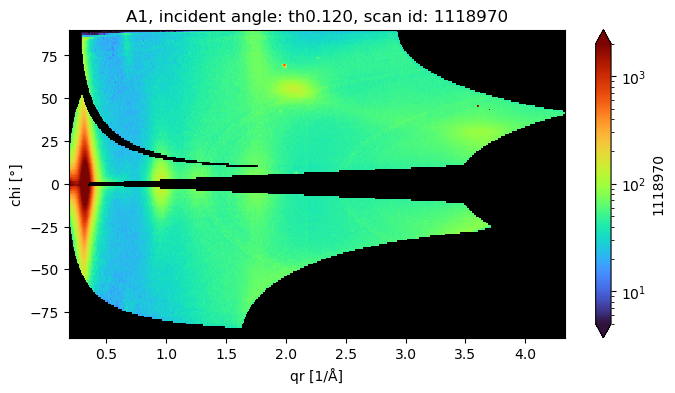

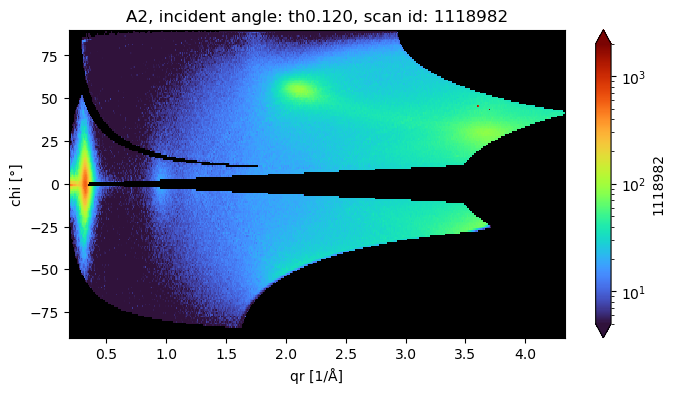

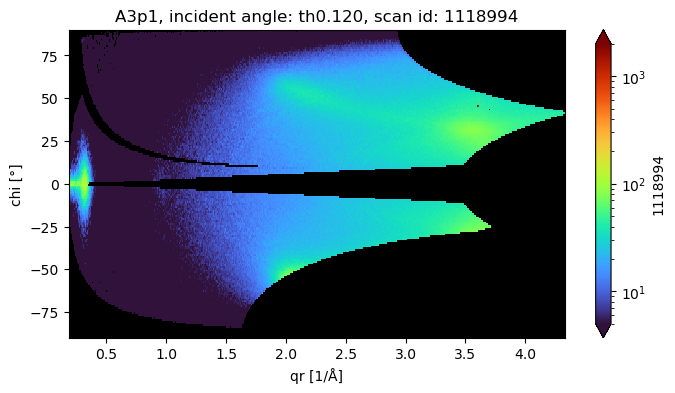

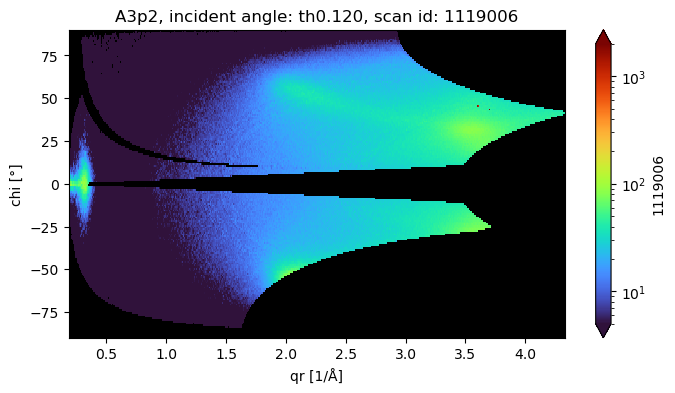

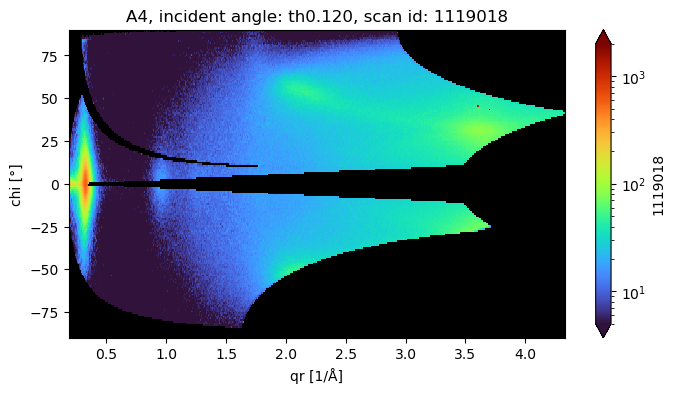

...

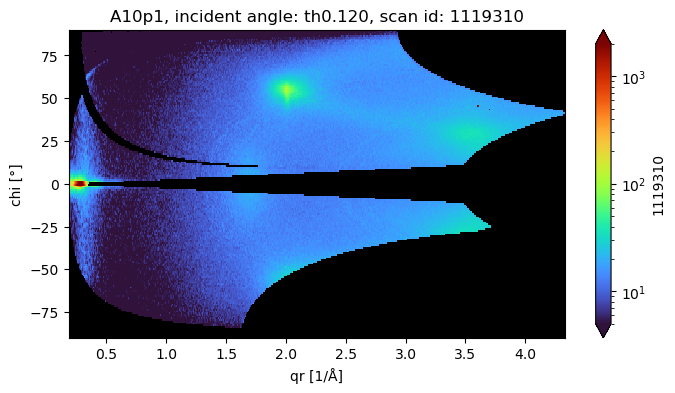

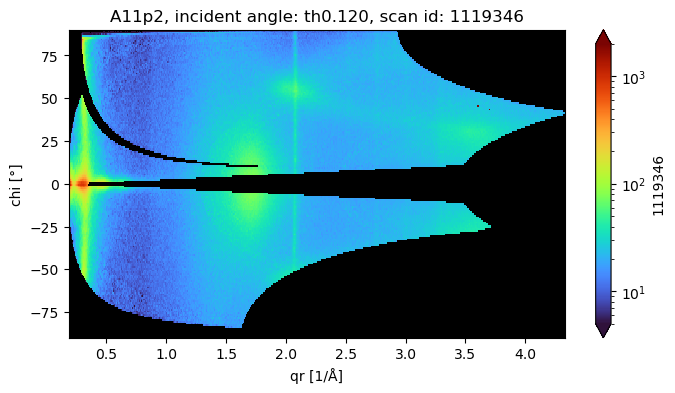

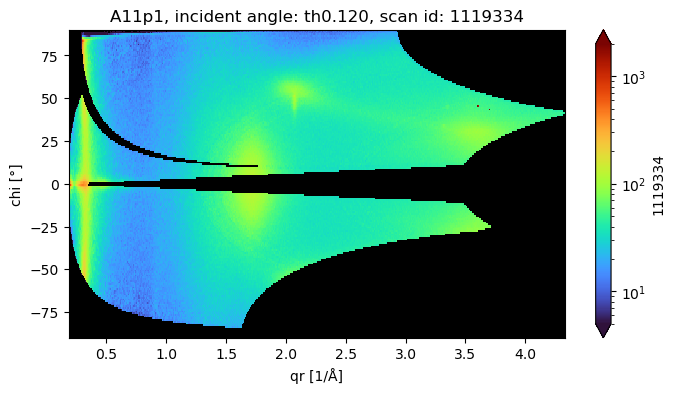

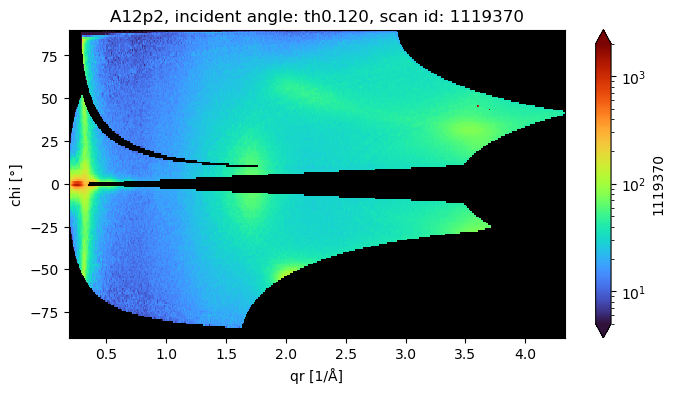

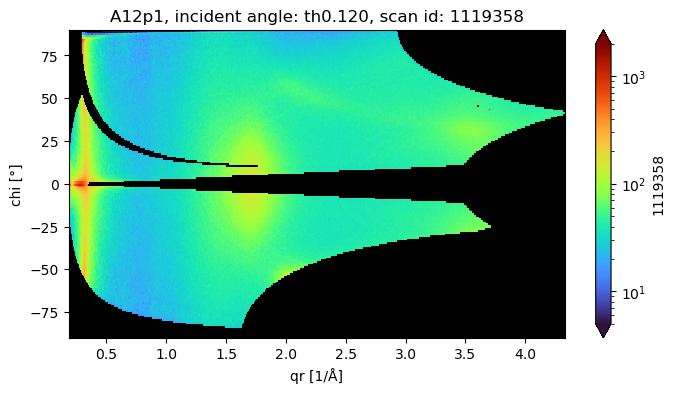

In [12]:
for DA in selected_dataarrays:   
    # ax = DA.sel(q_xy=slice(-1.1, 2.1), q_z=slice(-0.05, 2.4)).plot.imshow(cmap=cmap, norm=LogNorm(5e0, 2e3), figsize=(8,4))
    # ax.axes.set(aspect='equal', title=f'{DA.sample_id}, incident angle: {DA.incident_angle}, scan id: {DA.scan_id}')
    ax = DA.sel().plot.imshow(cmap=cmap, norm=LogNorm(5e0, 2e3), figsize=(8,4))    
    ax.axes.set(title=f'{DA.sample_id}, incident angle: {DA.incident_angle}, scan id: {DA.scan_id}')
    plt.show()

#### Save dataset as a .zarr store:

In [13]:
outPath

PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/AL_processed_data')

In [14]:
# Specify a suffix for saving the raw, recip, and caked DataSets. 
suffix=f'bladecoated_films_waxs_stitched'

raw_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(outPath.joinpath('ex_situ_zarrs', f'caked_{suffix}.zarr'), mode='w')

### qpara set

#### Load the images into a single xr.DataSet:

In [ ]:
# Select the first element of the sorted set outside of the for loop to initialize the xr.DataSet
DA = qpara_loader.loadSingleImage(sorted(qpara_set)[0])
recip_DA, caked_DA = qpara_transformer.pg_convert(DA)

# Create a DataSet, each DataArray will be named according to it's scan id
raw_DS = DA.to_dataset(name=DA.scan_id)
recip_DS = recip_DA.to_dataset(name=DA.scan_id)
caked_DS = caked_DA.to_dataset(name=DA.scan_id)

# Populate the DataSet with 
for filepath in tqdm(sorted(qpara_set)[1:]):
    DA = qpara_loader.loadSingleImage(filepath)
    recip_DA, caked_DA = qpara_transformer.pg_convert(DA)
    
    raw_DS[f'{DA.scan_id}'] = DA
    recip_DS[f'{DA.scan_id}'] = recip_DA    
    caked_DS[f'{DA.scan_id}'] = caked_DA

#### Save dataset as a .zarr store:

In [ ]:
# Specify a suffix for saving the raw, recip, and caked DataSets. 
# I use a try/except statement because not all my DataArrays will have the same attribute present
try: 
    orientation = DA.attrs['in-plane_orientation']
except KeyError:
    orientation = 'qpara' 
finally:
    suffix=f'{DA.material}_{orientation}_{DA.sample_number}'

raw_DS.to_zarr(savePath.joinpath('qpara_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(savePath.joinpath('qpara_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(savePath.joinpath('qpara_zarrs', f'caked_{suffix}.zarr'), mode='w')

### series set

#### Save each series as its own DataSet
The time dimension doesn't line up for this, so it isn't very amenable for all the series to be stored
together. Better to just store them as their own arrays. Zarr requires DataSets to work with, so we convert to a DataSet just to save them.

In [ ]:
DA = series_loader.loadSeries(sorted(series_set))
recip_DA, caked_DA = qpara_transformer.pg_convert_series(DA)

# Transform DataArrays into DataSets & save as .zarr stores
raw_DS = DA.to_dataset(name='DA')
recip_DS = recip_DA.to_dataset(name='DA')
caked_DS = caked_DA.to_dataset(name='DA')

# Specify a suffix for saving the raw, recip, and caked DataSets. 
suffix = f'{DA.scan_id}_{DA.material}_0to90s_qpara_{DA.sample_number}'

raw_DS.to_zarr(savePath.joinpath('series_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(savePath.joinpath('series_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(savePath.joinpath('series_zarrs', f'caked_{suffix}.zarr'), mode='w')

In [ ]:
# Specify a suffix for saving the raw, recip, and caked DataSets. 
suffix = f'{DA.scan_id}_{DA.material}_0to90s_qpara_{DA.sample_number}'

raw_DS.to_zarr(savePath.joinpath('series_zarrs', f'raw_{suffix}.zarr'), mode='w')
recip_DS.to_zarr(savePath.joinpath('series_zarrs', f'recip_{suffix}.zarr'), mode='w')
caked_DS.to_zarr(savePath.joinpath('series_zarrs', f'caked_{suffix}.zarr'), mode='w')

In [ ]:
time_starts = [0, 10, 90]
time_ranges = ['0to10', '10to90', '90to180']
for i, series in enumerate((exp0p1_set, exp0p5_set, exp2p0_set)):
    # Select the first element of the sorted set outside of the for loop to initialize the xr.DataSet
    DA = series_loader.loadSeries(sorted(series), time_start= time_starts[i])
    recip_DA, caked_DA = qpara_transformer.pg_convert_series(DA)

    # Transform DataArrays into DataSets & save as .zarr stores
    raw_DS = DA.to_dataset(name='DA')
    recip_DS = recip_DA.to_dataset(name='DA')
    caked_DS = caked_DA.to_dataset(name='DA')

    # Specify a suffix for saving the raw, recip, and caked DataSets. 
    suffix = f'{DA.scan_id}_{DA.material}_{time_ranges[i]}s_qpara_{DA.sample_number}'

    raw_DS.to_zarr(savePath.joinpath('series_zarrs', f'raw_{suffix}.zarr'), mode='w')
    recip_DS.to_zarr(savePath.joinpath('series_zarrs', f'recip_{suffix}.zarr'), mode='w')
    caked_DS.to_zarr(savePath.joinpath('series_zarrs', f'caked_{suffix}.zarr'), mode='w')

In [ ]:
whos DataArray

In [ ]:
whos Dataset

In [ ]:
del DA, caked_DA, recip_DA, caked_DS, raw_DS, recip_DS

In [ ]:
gc.collect()

## Unorganized plotting cells used to check data

In [ ]:
# Example of how to load a zarr dataset:
DS = xr.open_zarr(savePath.joinpath('series_zarrs', f'recip_1117624_pm7_10to90s_qpara_009.zarr'))
recip_DA = DS.DA

In [ ]:
recip_DA

In [ ]:
# example of selecting dataarrays within an xr dataset
selected_dataarrays = [da for da in raw_DS.data_vars.values() 
                       if da.attrs['exposure_time'] == '5.00s' and 
                       da.attrs['incident_angle'] == 'th0.120' and 
                       da.attrs['x_position_offset'] == 'x0.001']

# print(f'{len(selected_dataarrays)} DataArray:')
# for da in selected_dataarrays:
#     display(da)

In [ ]:
# ax = recip_DA.sel(q_perp=slice(-2, 1), q_z=slice(-0.01, 2)).plot.imshow(norm=LogNorm(4e1, 2.5e3), cmap=plt.cm.turbo, interpolation='antialiased')
# ax.axes.set(aspect='equal', xlabel='$q_{perp}$ $[Å^{-1}]$', ylabel='$q_{z}$ $[Å^{-1}]$', title=f'1% CN, 5 s exposure, 0.12° incident angle')
# ax.figure.set(size_inches=(7,3.5), tight_layout=True)
# plt.show()
# # ax.figure.savefig(savePath.joinpath(f'{recip_da.material}_{recip_da.solvent}_qperp_{recip_da.incident_angle}_{recip_da.exposure_time}_{recip_da.scan_id}.png'), dpi=120)
# plt.close('all')

In [ ]:
### Define color limits acceptable for the different exposure times
recip_vlims = {
    recip_pybtz_CB_0to10s_series.exposure_time: (0.8, 4e1),
    recip_pybtz_CB_10to90s_series.exposure_time: (4, 2e2),
    recip_pybtz_CB_90to180s_series.exposure_time: (3e1, 1e3)
}

### Select 2D Plot

In [16]:
cmap = plt.cm.turbo
cmap.set_bad('black')

In [ ]:
ax = recip_DA.sel(time=70, method='nearest').sel(q_z=slice(-0.01,2), q_para=slice(-2,2)).plot.imshow(cmap=cmap, norm=LogNorm(4, 2e2), figsize=(10,4), interpolation='antialiased')
ax.axes.set(aspect='equal', xlabel='$q_{para}$ $[Å^{-1}]$', ylabel='$q_{z}$ $[Å^{-1}]$')
plt.show()

In [ ]:
ax = DS.DA.sel(time=100, qr=slice(0,2), chi=slice(-90, 60)).plot.imshow(cmap=cmap, norm=LogNorm(4e1, 1e3), figsize=(8,6), interpolation='antialiased')
ax.axes.set(aspect=1.5e-2)
plt.show()

In [ ]:
caked_pybtz_CB_0to10s_series.sel(time=slice(0,1)).plot(col='time', col_size=4)

In [ ]:
caked_pybtz_CB_90to180s_series.sel(time=100, qr=slice(0,2), chi=slice(5,25)).sum('chi').plot()

In [ ]:
selected_dataarrays = [da for da in raw_DS.data_vars.values() 
                       if da.attrs['exposure_time'] == '5.00s' and 
                       da.attrs['incident_angle'] == 'th0.120' and 
                       da.attrs['x_position_offset'] == 'x0.002']
len(selected_dataarrays)

In [ ]:
clim = LogNorm(0.8, 4e3)
cmap = plt.cm.turbo
cmap.set_bad('black')

In [ ]:
ax = recip_DA.sel(q_z=slice(0,0.5), q_perp=slice(-0.5, 0.5)).plot.imshow(cmap=plt.cm.turbo, norm=clim, figsize=(20,2))
ax.axes.set(aspect=1/4)

In [ ]:
caked_DA.plot.imshow(cmap=plt.cm.turbo, norm=clim)

In [ ]:
selected_dataarrays[0].plot.imshow(cmap=plt.cm.turbo, norm=clim)